# Processamento de Imagens em Python: scikit-image

![](python-logo.png)
![](logo.png)


# O que é uma imagem?

![](pdi.png)

### Como ler uma imagem

In [1]:
#importar a funcao imread da biblioteca skimage
from skimage.io import imread

In [1]:
!python -m pip install -U scikit-image


  Obtaining dependency information for scikit-image from https://files.pythonhosted.org/packages/ce/d0/a3f60c9f57ed295b3076e4acdb29a37bbd8823452562ab2ad51b03d6f377/scikit_image-0.22.0-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for numpy>=1.22 from https://files.pythonhosted.org/packages/82/0f/3f712cd84371636c5375d2dd70e7514d264cec6bdfc3d7997a4236e9f948/numpy-1.26.1-cp311-cp311-win_amd64.whl.metadata
     ---------------------------------------- 0.0/61.2 kB ? eta -:--:--
     ---------------------------------------- 0.0/61.2 kB ? eta -:--:--
     ------ --------------------------------- 10.2/61.2 kB ? eta -:--:--
     ------------------------- ------------ 41.0/61.2 kB 326.8 kB/s eta 0:00:01
     -------------------------------------- 61.2/61.2 kB 467.5 kB/s eta 0:00:00
  Obtaining dependency information for scipy>=1.8 from https://files.pythonhosted.org/packages/81/d7/d2537d51efb692d0c411e64267ba349e7668d40f5bc73cefe78ccd650dcd/scipy-1.11.3-cp311-cp311-win_am

In [3]:
#ler imagem
imagem = imread('picos.jpg')

In [4]:
imagem.shape

(685, 1056, 3)

### Como mostrar uma imagem

In [5]:
#importar a biblioteca matplotlib
import matplotlib.pyplot as plt


In [6]:
!python -m pip install -U matplotlib


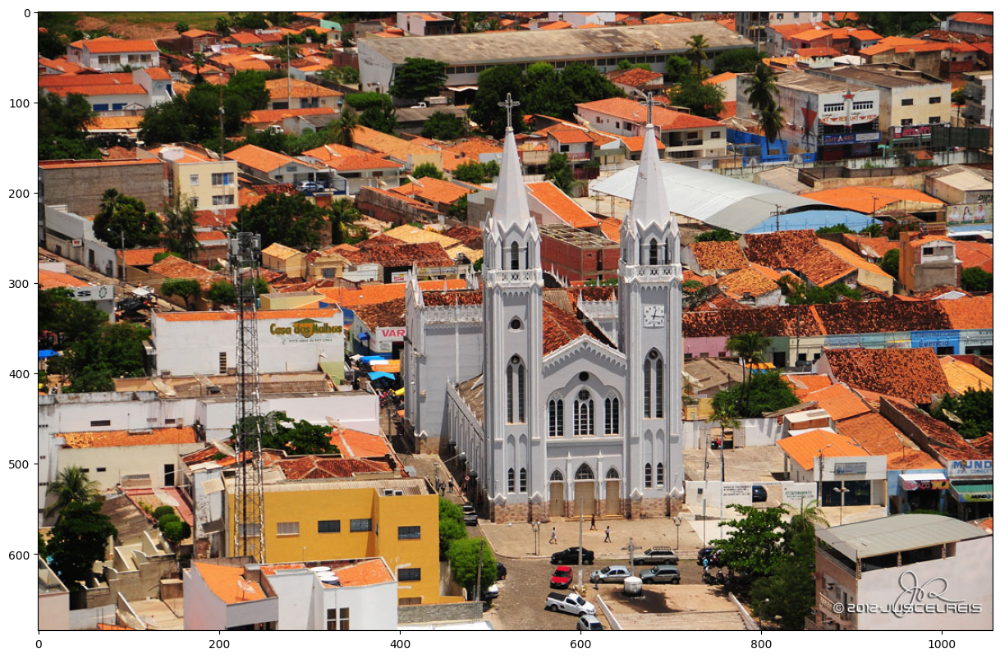

In [7]:
plt.figure(figsize=(15,30))
plt.imshow(imagem);

### Informações da Imagem

In [8]:
#dimensões
dim = imagem.shape[2]
dim

3

### Trabalhando com Imagens Coloridas (RGB)

In [9]:
red = imagem[:,:,0]
green = imagem[:,:,1]
blue = imagem[:,:,2]

In [10]:
blue.shape

(685, 1056)

### Mostrar várias imagens

Text(0.5, 1.0, 'Canal Blue do Sistema de Cores RGB')

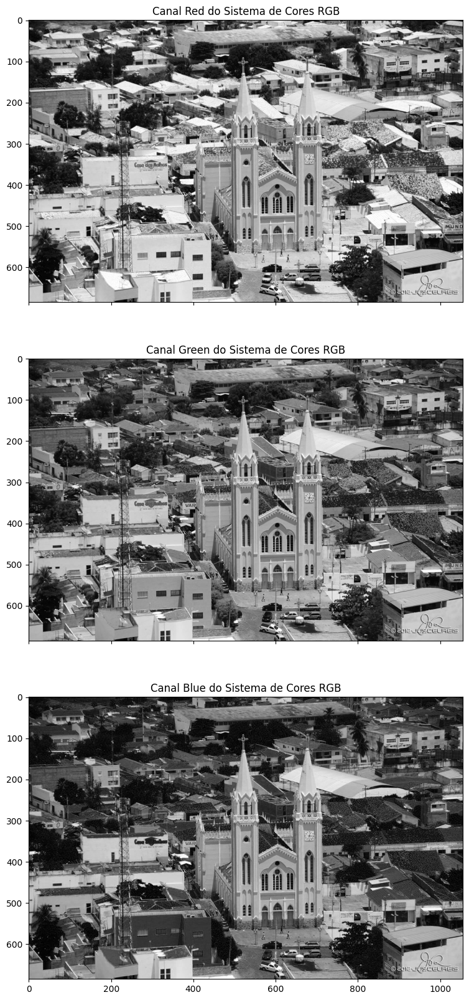

In [11]:
fig, ax = plt.subplots(3,1,figsize=(20, 20),sharex=True)
ax[0].imshow(red,cmap = 'gray')
ax[0].set_title('Canal Red do Sistema de Cores RGB')
ax[1].imshow(green,cmap = 'gray')
ax[1].set_title('Canal Green do Sistema de Cores RGB')
ax[2].imshow(blue,cmap = 'gray')
ax[2].set_title('Canal Blue do Sistema de Cores RGB')

### Níveis de cinza

In [12]:
from skimage.color import rgb2gray

In [13]:
cinza = rgb2gray(imagem)

Text(0.5, 1.0, 'Imagens em Níveis de Cinza')

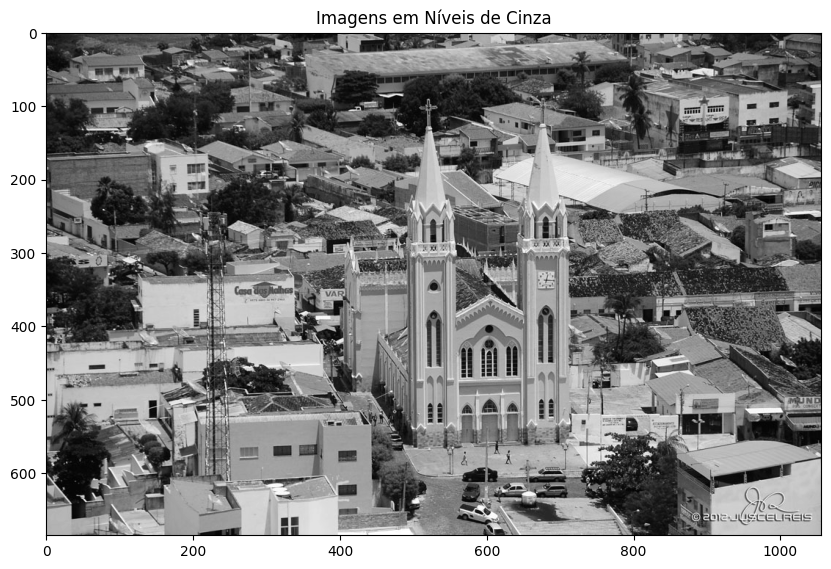

In [14]:
plt.figure(figsize=(10,10))
plt.imshow(cinza,cmap='gray')
plt.title('Imagens em Níveis de Cinza')

# Outros modelos de cores

In [15]:
from skimage.color import rgb2gray
from skimage.color import rgb2hsv

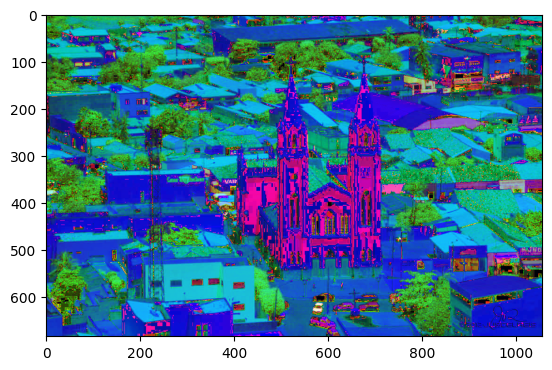

In [16]:
lab = rgb2hsv(imagem)
plt.imshow(lab)

### Salvar resultado

In [17]:
#importar a funcao imsave da biblioteca skimage
#from skimage.io import imsave

In [18]:
#imsave('picos_cia.png',cinza)

### Remoção de Ruídos

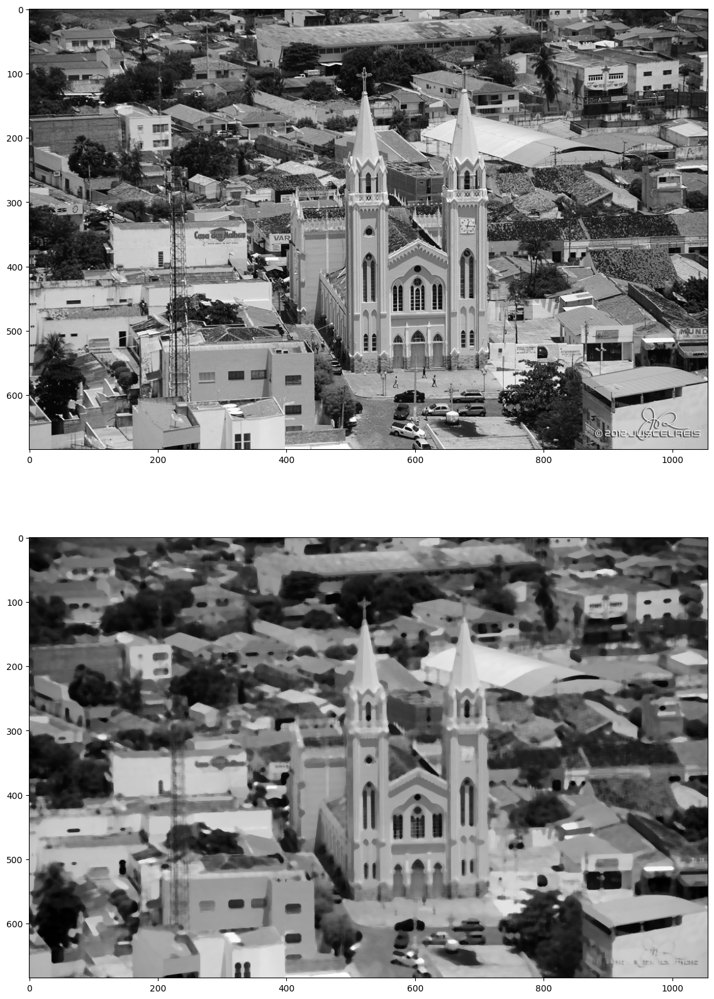

In [19]:
from skimage.filters import median
from skimage.morphology import square

im_filtrada = median(cinza,square(7))

_, ax = plt.subplots(2,1,figsize=(15,20))
ax[0].imshow(cinza,cmap='gray')
ax[1].imshow(im_filtrada,cmap='gray')


# Atividade 
- Use uma imagem e faça esse filtro varias vezes com janelas de três até treze
- Plot os resultados

### Percorendo uma imagem


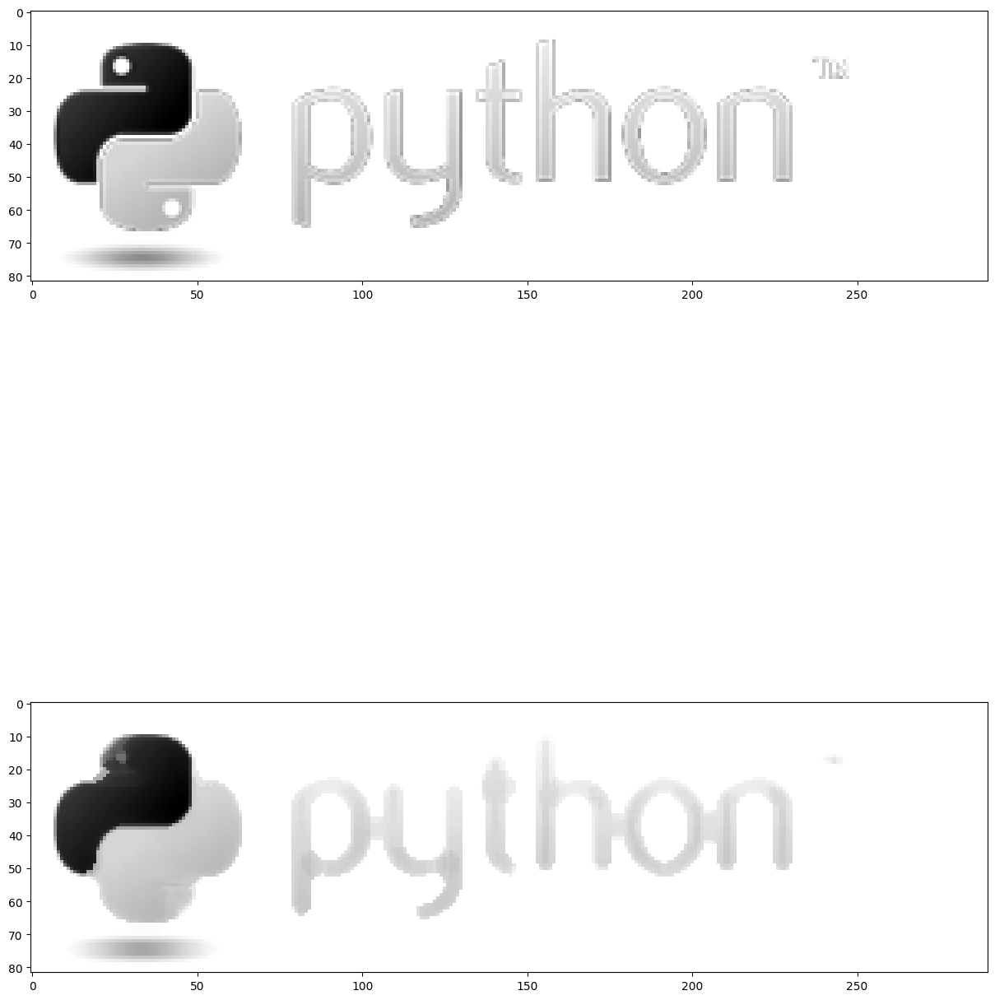

In [20]:
img = imread("python-logo.png",as_gray=True)
img_test = median(img,square(7))

_, ax = plt.subplots(2,1,figsize=(15,20))
ax[0].imshow(img,cmap='gray')
ax[1].imshow(img_test,cmap='gray')

In [21]:
linhas,colunas,dimensao = imagem.shape #pegar dimensoes da imagem

In [22]:
for l in range(linhas):
    for c in range(colunas):
        if(imagem[l,c,2] < 200 ):
            imagem[l,c,:] = 0

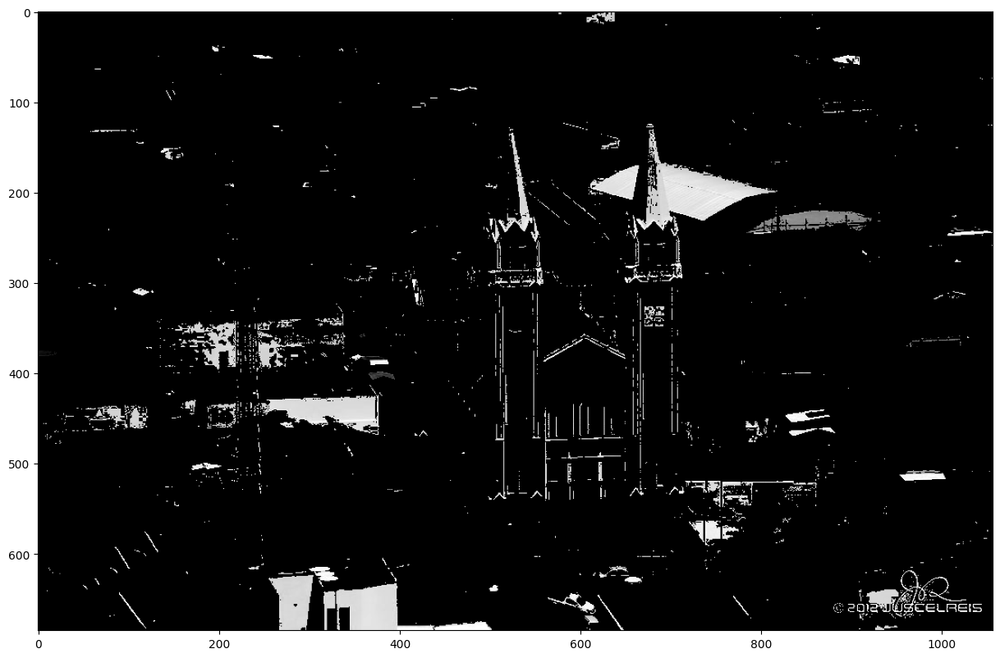

In [23]:
plt.figure(figsize=(15,30))
plt.imshow(imagem[:,:,0],cmap = 'gray')

## Atividade 
- Percorra sua imagem e ache o pixel com maior valor em cada uma das componentes


In [24]:
img = imread("python-logo.png")
linhas,colunas,dimensao = img.shape #pegar dimensoes da imagem

maior_pixel = [0,0,0]

for l in range(0,linhas,1):
    for c in range(0,colunas,1):
        if(img[l,c,0] > maior_pixel[0] and img[l,c,1] > maior_pixel[1] and img[l,c,2] > maior_pixel[2]):
            maior_pixel = img[l,c]
            
print(f"O maior pixel foi {maior_pixel[0:3]}")

O maior pixel foi [255 255 255]


# Imagens Preto e Branco

In [25]:
import numpy as np
from skimage.filters import threshold_otsu

In [26]:
#método de Otsu
otsu = threshold_otsu(cinza)
preto_branco = cinza < otsu 

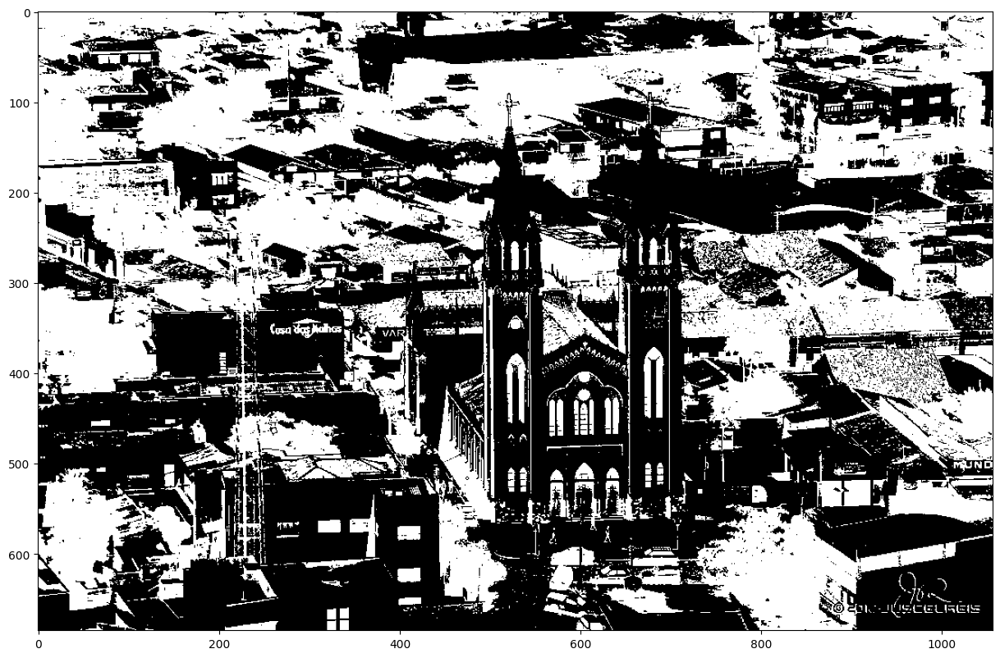

In [27]:
plt.figure(figsize=(15,30))
plt.imshow(preto_branco,cmap = 'gray')

# Atividade
- Faça uma binarização na imagem variando o limiar entre 0 e 1 com passos de 0.2
- Plot os resultados

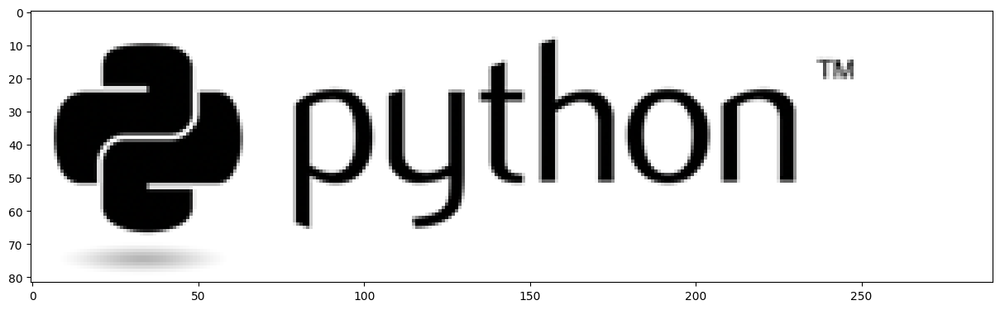

In [28]:
from random import randint
img = imread("python-logo.png")
nova_img = img

for l in range(0,linhas,1):
    for c in range(0,colunas,1):
        nova_img[l,c,0] = randint(0,1)
        nova_img[l,c,1] = randint(0,1)
        nova_img[l,c,2] = randint(0,1)
            
plt.figure(figsize=(15,30))
plt.imshow(nova_img)

### Encontrando Bordas

In [29]:
from skimage.filters import sobel,roberts,prewitt,scharr

In [30]:
contorno = sobel(preto_branco)

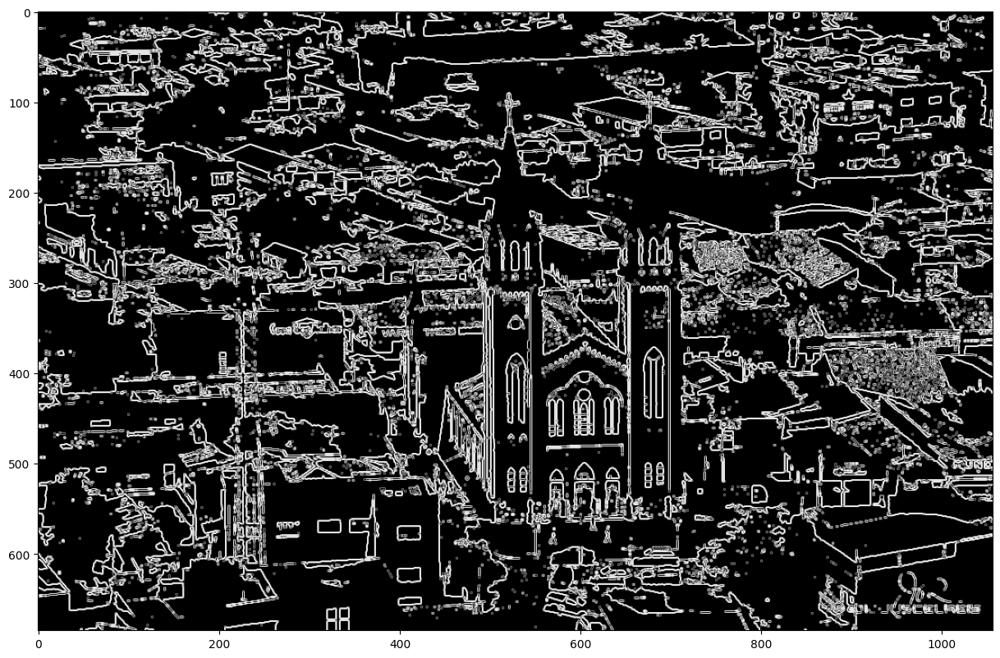

In [31]:
plt.figure(figsize=(15,30))
plt.imshow(contorno,cmap = 'gray')

## Atividade
- Transforme uma imagem para preto e branco
- Utilize outros métodos que não seja o de Sobel para encontrar as bordas. Ex: scharr, prewitt e roberts
- Faça um plot com todos os métodos que você utilizou

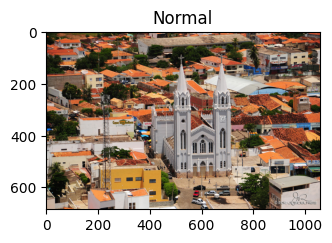

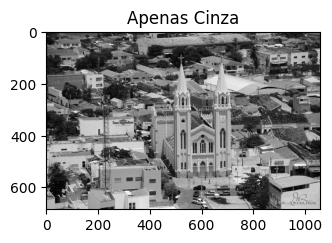

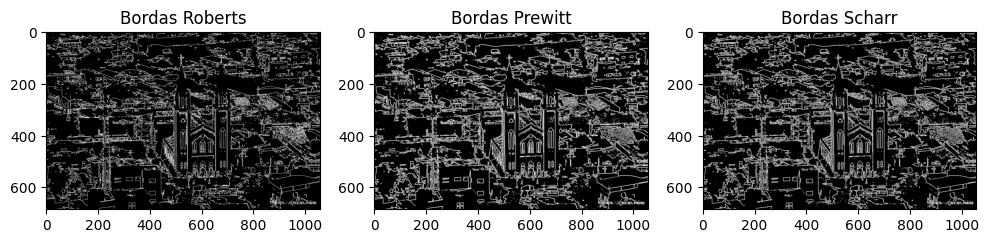

In [44]:
from skimage.filters import threshold_otsu

nome_img = "picos.jpg"

img_normal = imread(nome_img)
img_gray = imread(nome_img, as_gray=True)

otsu = threshold_otsu(img_gray)

img_black_white =  img_gray < otsu 

img_roberts = roberts(img_black_white)
img_prewitt = prewitt(img_black_white)
img_scharr = scharr(img_black_white)

plt.figure(figsize=(12, 3))
plt.subplot(131)
plt.imshow(img_normal)
plt.title('Normal')

plt.figure(figsize=(12, 3))
plt.subplot(131)
plt.imshow(img_gray, cmap='gray')
plt.title('Apenas Cinza')

# Exibir as bordas detectadas
plt.figure(figsize=(12, 4))
plt.subplot(131)
plt.imshow(img_roberts, cmap='gray')
plt.title('Bordas Roberts')

plt.subplot(132)
plt.imshow(img_prewitt, cmap='gray')
plt.title('Bordas Prewitt')

plt.subplot(133)
plt.imshow(img_scharr, cmap='gray')
plt.title('Bordas Scharr')

plt.show()

### Recortes em Imagens

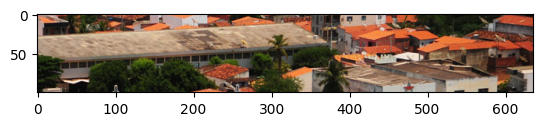

In [33]:
imagem = imread('picos.jpg')
recorte_imagem = imagem[:100,420:,:]
plt.imshow(recorte_imagem,cmap='gray')